# Introduction au Reservoir Computing avec ReservoirPy


**Nathan Trouvain <br>
Inria - Mnemosyne**

<br>
<br>
<br>
AI4I - 17 janvier 2023

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import reservoirpy as rpy
from reservoirpy.observables import nrmse, rsquare

from IPython.display import Image
from IPython.core.display import HTML
HTML("""
<style>
.img-center {
    display: block;
    margin-left: auto;
    margin-right: auto;
    }
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
    }
</style>
""")

rpy.verbosity(0)
rpy.set_seed(42)

## Sommaire

- <a href="#concepts">Concepts et fonctionnalités clés</a>
- <a href="#pred">Prédictions de séries temporelles</a>
- <a href="#gen">Déployer les capacités génératives</a>
- <a href="#online">Apprentissage en ligne</a>
- <a href="#hyper">Comprendre les hyperparamètres</a>
- <a href="#chapitre4">Démonstration d'application - chute de robot</a>
- <a href="#chapitre5">Démonstration d'application - chants de canaris</a>
- <a href="#imdb">Démonstration d'application - analyse de sentiment</a>

## Concepts et fonctionnalités clés <a id="concepts"></a>


- Numpy, Scipy, et seulement Numpy et Scipy
- Exécution efficace (parallélisation des calculs, optimisation des règles d'apprentissage)
- Plusieurs méthodes d'apprentissage, *online*, *offline*
- Flexibilité des architectures
- Outils d'aide à l'optimisation des paramètres

- Documentation: https://reservoirpy.readthedocs.io/en/latest/
- GitHub: https://github.com/reservoirpy/reservoirpy

## Informations générales

- Toutes les données sont des tableaux NumPy
- Le temps est toujours représenté par la première dimension des tableaux/vecteurs.

## Prédiction de séries temporelles <span id="pred"/>

**Un exemple: l'attracteur de Lorenz**

$$
\begin{split}
    \dot{x}(t) &= \sigma (y(t) - x(t)) \\
    \dot{y}(t) &= \rho x(t) - y(t) - x(t)z(t) \\
    \dot{z}(t) &= x(t)y(t) - \beta z(t)
\end{split}
$$

- décrit l'évolution des phénomènes de convection dans un fluide

In [2]:
from reservoirpy.datasets import lorenz

timesteps = 3000
X = lorenz(timesteps, x0=[17.67, 12.93, 43.91])

In [3]:
def plot_lorenz(X, sample):

    x, y, z = X[:, 0], X[:, 1], X[:, 2]
    fig = plt.figure(figsize=(13, 5))
    N = sample

    ax = plt.subplot((121))
    plt.title(f"Série temporelle - {sample} pas")
    t = np.linspace(0, N, N)
    for i in range(N-1):
        ax.plot(t[i:i+2], x[i:i+2], color=plt.cm.magma(255*i//N), lw=1.0)

    plt.xlabel("$t$")
    plt.ylabel("$x(t)$")

    ax2 = plt.subplot((122),  projection="3d")
    ax2.margins(0.05)
    for i in range(N-1):
        ax2.plot(x[i:i+2], y[i:i+2], z[i:i+2], color=plt.cm.magma(255*i//N), lw=1.0)
    ax2.set_xlabel("$x(t)$")
    ax2.set_ylabel("$y(t)$")
    ax2.set_zlabel("$z(t)$")


    plt.tight_layout()
    plt.show()

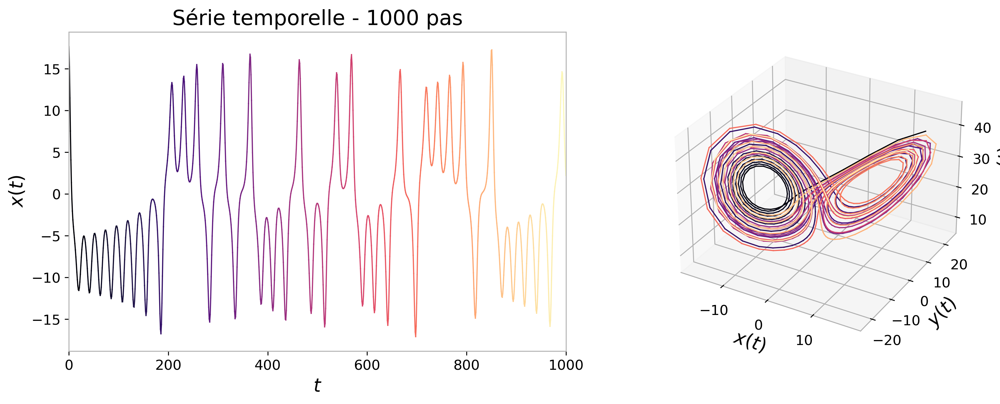

In [4]:
plot_lorenz(X, 1000)

Connaissant la valeur de la séries à l'instant $t$:
- Comment prédire $t+1$, $t+100$...?
- Comment prédire $t+1$, $t+2$, $\dots$, $t+n$ ?

### Prédire la valeur de la série à un horizon de 10 pas de temps

Prédire $P(t + 10)$ connaissant $P(t)$.

In [5]:
def plot_train_test(X_train, y_train, X_test, y_test):
    sample = 500
    test_len = X_test.shape[0]
    fig = plt.figure(figsize=(15, 5))
    plt.plot(np.arange(0, 500), X_train[-sample:, 0], label="Données d'entraînement")
    plt.plot(np.arange(0, 500), y_train[-sample:, 0], label="Objectif d'entraînement")
    plt.plot(np.arange(500, 500+test_len), X_test[:, 0], label="Données de test")
    plt.plot(np.arange(500, 500+test_len), y_test[:, 0], label="Objectif de test")
    plt.legend()
    plt.show()

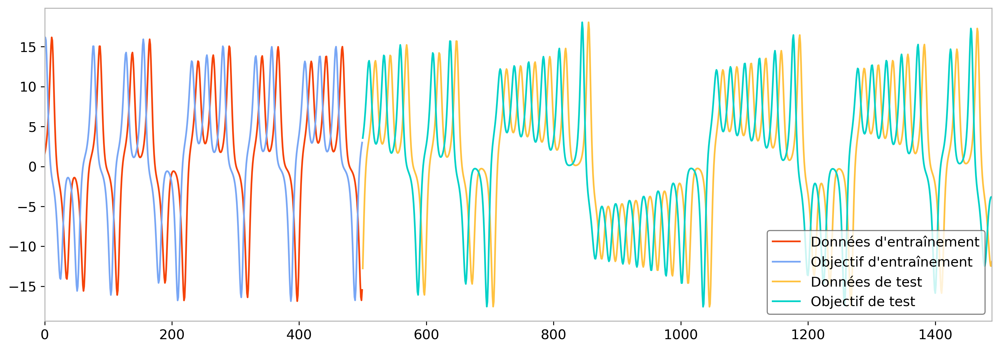

In [6]:
from reservoirpy.datasets import to_forecasting

x, y = to_forecasting(X, forecast=10)
X_train1, y_train1 = x[:2000], y[:2000]
X_test1, y_test1 = x[2000:], y[2000:]

plot_train_test(X_train1, y_train1, X_test1, y_test1)

### Rappels sur le Reservoir Computing


<style>
.img-center {
    display: block;
    margin-left: auto;
    margin-right: auto;
    width: 50%;
    }
</style>
<div class="img-center">
    <img src="./static/esn.svg" width="700">
</div>

$$
x[t+1]= (1 - \alpha) x[t] + \alpha f(W \cdot x[t] + W_{in} \cdot u[t] + W_{fb} \cdot y[t])
$$
$$
y[t]= W_{out}^{\intercal} x[t]
$$

### *Echo State Networks* avec ReservoirPy

Utilisation de *Nodes* pour constuire des modèles:


<style>
.img-center {
    display: block;
    margin-left: auto;
    margin-right: auto;
    width: 50%;
    }
</style>
<div class="img-center">
    <img src="./static/esn_nodes.svg" width="700">
</div>

<style>
.img-center {
    display: block;
    margin-left: auto;
    margin-right: auto;
    width: 50%;
    }
</style>
<div class="img-center">
    <img src="./static/esn_nodes_fb.svg" width="700">
</div>

In [7]:
def plot_results(y_pred, y_test, sample=500):
    labels = ["$x[t]$", "$y[t]$", "$z[t]$"]
    fig, axes = plt.subplots(3, 1, figsize=(13, 5))
    for i in range(3):
        ax = axes[i]
        ax.plot(np.arange(sample), y_pred[:sample, i], lw=3, label="Prédictions")
        ax.plot(np.arange(sample), y_test[:sample, i], linestyle="--", lw=2, label="Série réelle")
        ax.plot(np.abs(y_test[:sample, i] - y_pred[:sample, i]), label="Erreur absolue")
        ax.set_ylabel(labels[i])

    plt.legend()
    plt.show()

#### Préparation de l'ESN

In [8]:
units = 100               # - nombre de neurones
leak_rate = 0.3           # - leaking rate
spectral_radius = 0.95    # - rayon spectral
input_scaling = 0.5       # - facteur de mise à l'échelle des entrées (input scaling)
connectivity = 0.1        # - densité des connexions du reservoir vers lui même
input_connectivity = 0.2  # et des entrées vers le reservoir
regularization = 1e-4     # - coefficient de régularisation (L2)
transient = 100           # - temps de chauffe du reservoir
seed = 1234               # - reproductibilité

In [9]:
def reset_esn():
    from reservoirpy.nodes import Reservoir, Ridge

    reservoir = Reservoir(units, input_scaling=input_scaling, sr=spectral_radius,
                          lr=leak_rate, rc_connectivity=connectivity,
                          input_connectivity=input_connectivity, seed=seed)

    readout   = Ridge(ridge=regularization)

    return reservoir >> readout

In [10]:
from reservoirpy.nodes import Reservoir, Ridge

reservoir = Reservoir(units, input_scaling=input_scaling, sr=spectral_radius,
                      lr=leak_rate, rc_connectivity=connectivity,
                      input_connectivity=input_connectivity, seed=seed)

readout   = Ridge(ridge=regularization)

<style>
.img-center {
    display: block;
    margin-left: auto;
    margin-right: auto;
    width: 50%;
    }
</style>
<div class="img-center">
    <img src="./static/esn_nodes.svg" width="500">
</div>

In [11]:
esn = reservoir >> readout

<style>
.img-center {
    display: block;
    margin-left: auto;
    margin-right: auto;
    width: 50%;
    }
</style>
<div class="img-center">
    <img src="./static/esn_nodes_fb.svg" width="500">
</div>

In [12]:
reservoir_fb = reservoir << readout

esn_fb = reservoir_fb >> readout

#### Entraînement de l'ESN

L'apprentissage est *offline* ("hors-ligne") : il n'a lieu qu'une seule fois, sur l'ensemble des données d'entraînement.

In [13]:
esn.fit(X_train1, y_train1, warmup=transient);

In [14]:
def plot_readout(readout):
    Wout = readout.Wout
    bias = readout.bias
    Wout = np.r_[bias, Wout]

    fig = plt.figure(figsize=(15, 5))

    ax = fig.add_subplot(111)
    ax.grid(axis="y")
    ax.set_ylabel("Coefs. de $W_{out}$")
    ax.set_xlabel("Neurones du reservoir")
    ax.bar(np.arange(Wout.size), Wout.ravel()[::-1])

    plt.show()

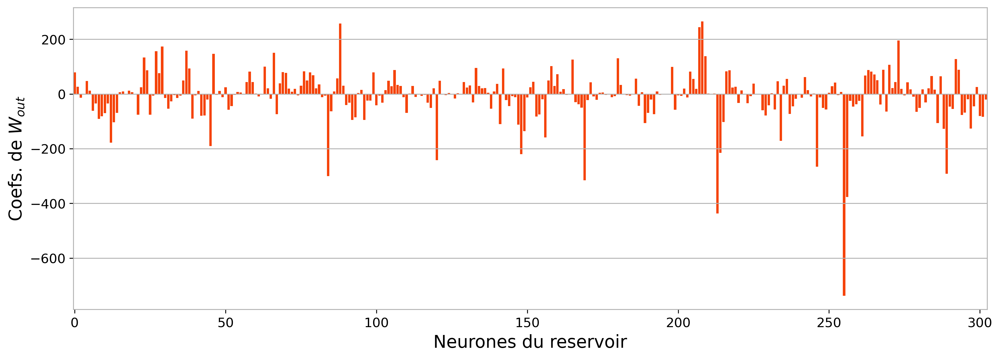

In [15]:
plot_readout(readout)

#### Test de l'ESN

In [16]:
y_pred1 = esn.run(X_test1)

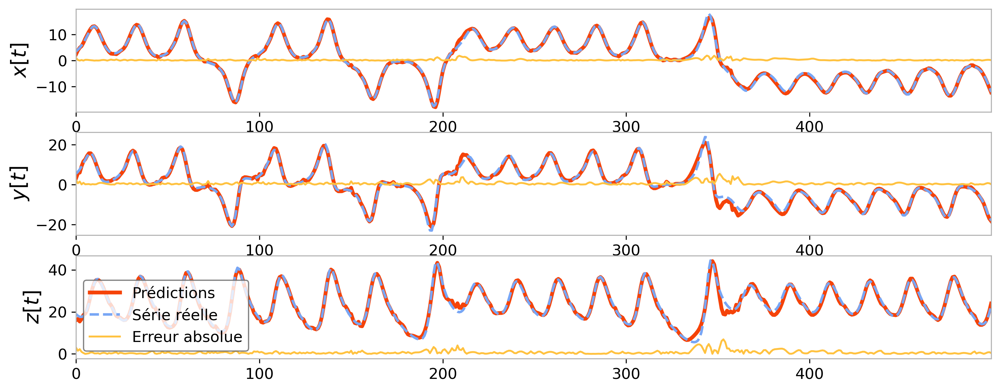

In [17]:
plot_results(y_pred1, y_test1)

Coefficient de détermination $R^2$ et erreur quadratique normalisée :

In [18]:
rsquare(y_test1, y_pred1), nrmse(y_test1, y_pred1)

(0.9961759934656298, 0.012317846485056738)

### Déployer les capacité génératives <span id="gen"/>

- Entraînement de l'ESN sur une tâche de prédiction de 1 pas de temps.
- Prédiction de l'ESN **sur ses prédictions précédentes** (mode génératif).

<div>
    <img src="./static/generative.png" width="900">
</div>

In [19]:
units = 300               # - nombre de neurones
leak_rate = 0.3           # - leaking rate
spectral_radius = 1.25    # - rayon spectral
input_scaling = 0.1       # - facteur de mise à l'échelle des entrées (input scaling)
connectivity = 0.1        # - densité des connexions du reservoir vers lui même
input_connectivity = 0.2  # et des entrées vers le reservoir
regularization = 1e-4     # - coefficient de régularisation (L2)
transient = 100           # - temps de chauffe du reseroivr
seed = 1234               # - reproductibilité

In [20]:
def plot_generation(X_gen, X_t, warming_out=None, warming_inputs=None):

    nb_generations = X_gen.shape[0]
    seed_timesteps = warming_inputs.shape[0]
    labels = ["$x[t]$", "$y[t]$", "$z[t]$"]
    fig, axes = plt.subplots(3, 1, figsize=(13, 5))
    for i in range(3):
        ax = axes[i]
        ax.set_ylabel(labels[i])

        if warming_out is not None:
            ax.plot(np.hstack([warming_out[:, i], X_gen[:, i]]), label="Série générée")
        else:
            ax.plot(X_gen[:, i], label="Série générée")

        ax.plot(np.arange(nb_generations)+seed_timesteps, X_t[:, i], linestyle="--", label="Série réelle")

        if warming_inputs is not None:
            ax.plot(np.arange(seed_timesteps), warming_inputs[:, i], linestyle="--", label="Données d'échauffement")

        if seed_timesteps > 0:
            ax.fill_between([0, seed_timesteps], *ax.get_ylim(),
                            facecolor='gray', alpha=0.5,
                            label="Echauffement")

    plt.plot([], [], ' ', label=f"$R^2 = {round(rsquare(X_t, X_gen), 4)}$")
    plt.plot([], [], ' ', label=f"$NRMSE = {round(nrmse(X_t, X_gen), 4)}$")
    plt.legend(
    )
    plt.show()

def plot_attractors(X_gen, X_t, warming_inputs, warming_out):

    labels = ["$x[t]$", "$y[t]$", "$z[t]$"]
    fig = plt.figure(figsize=(13,  5))

    ax1 = fig.add_subplot((121), projection="3d")
    ax1.plot(warming_inputs[:, 0], warming_inputs[:, 1], warming_inputs[:, 2], color="gray", linestyle="--")
    ax1.plot(X_t[:, 0], X_t[:, 1], X_t[:, 2])
    ax1.set_xlabel("$x(t)$")
    ax1.set_ylabel("$y(t)$")
    ax1.set_zlabel("$z(t)$")
    ax1.set_title("Série réelle")

    ax2 = fig.add_subplot((122), projection="3d")
    ax2.plot(warming_out[:, 0], warming_out[:, 1], warming_out[:, 2],
             color="gray", linestyle="--", label="Echauffement")
    ax2.plot(X_gen[:, 0], X_gen[:, 1], X_gen[:, 2], label="Prediction")
    ax2.set_title("Série prédite")


    plt.legend()
    plt.show()

#### Entraînement à la prévision sur un horizon court

In [21]:
esn = reset_esn()

x, y = to_forecasting(X, forecast=1)
X_train3, y_train3 = x[:2000], y[:2000]
X_test3, y_test3 = x[2000:], y[2000:]

esn = esn.fit(X_train3, y_train3, warmup=transient)

#### Génération

- 100 pas de temps de la série de test utilisés comme "échauffement";
- 300 pas de temps générés "à partir de rien";

In [22]:
seed_timesteps = 100

warming_inputs = X_test3[:seed_timesteps]

warming_out = esn.run(warming_inputs)  # échauffement

In [23]:
nb_generations = 500

X_gen = np.zeros((nb_generations, 3))
y = warming_out[-1]
for t in range(nb_generations):  # génération
    y = esn(y)
    X_gen[t, :] = y

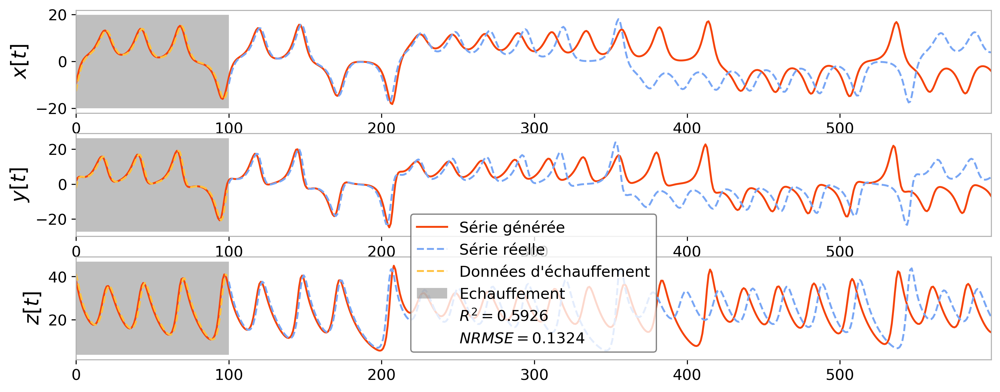

In [24]:
X_t = X_test3[seed_timesteps: nb_generations+seed_timesteps]
plot_generation(X_gen, X_t, warming_out=warming_out, warming_inputs=warming_inputs)

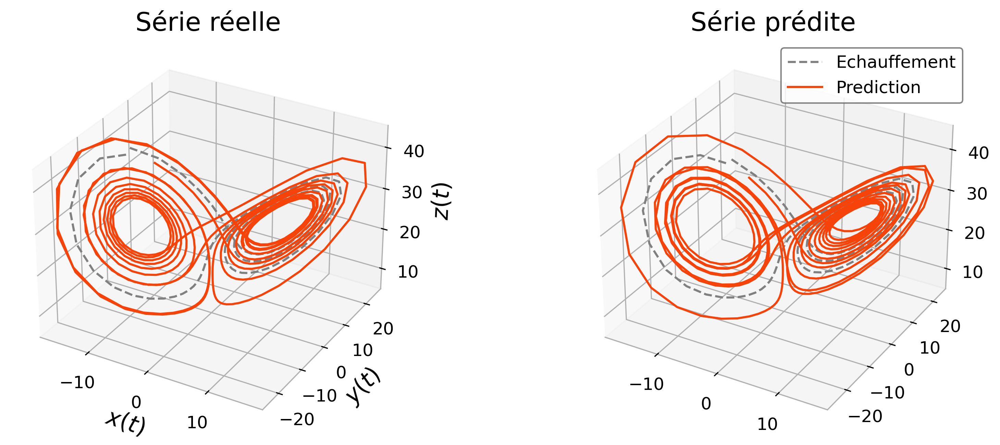

In [25]:
plot_attractors(X_gen, X_t, warming_inputs, warming_out)

## Apprentissage *online* <span id="online"/>

Apprentissage se déroulant de manière *incrémentale*.

Utilisation de l'algorithme **Recursive Least Squares**

<div>
    <img src="./static/online.png" width="700">
</div>

In [26]:
units = 100               # - nombre de neurones
leak_rate = 0.3           # - leaking rate
spectral_radius = 0.95    # - rayon spectral
input_scaling = 0.5       # - facteur de mise à l'échelle des entrées (input scaling)
connectivity = 0.1        # - densité des connexions du reservoir vers lui même
input_connectivity = 0.2  # et des entrées vers le reservoir
seed = 1234               # - reproductibilité

In [27]:
from reservoirpy.nodes import RLS

reservoir = Reservoir(units, input_scaling=input_scaling, sr=spectral_radius,
                      lr=leak_rate, rc_connectivity=connectivity,
                      input_connectivity=input_connectivity, seed=seed)

readout   = RLS()


esn_online = reservoir >> readout

#### Entraînement pas à pas

In [28]:
outputs_pre = np.zeros(X_train1.shape)
for t, (x, y) in enumerate(zip(X_train1, y_train1)): # pour chaque pas de temps de la série :
    prediction = esn_online.train(np.atleast_2d(x), np.atleast_2d(y))
    outputs_pre[t, :] = prediction

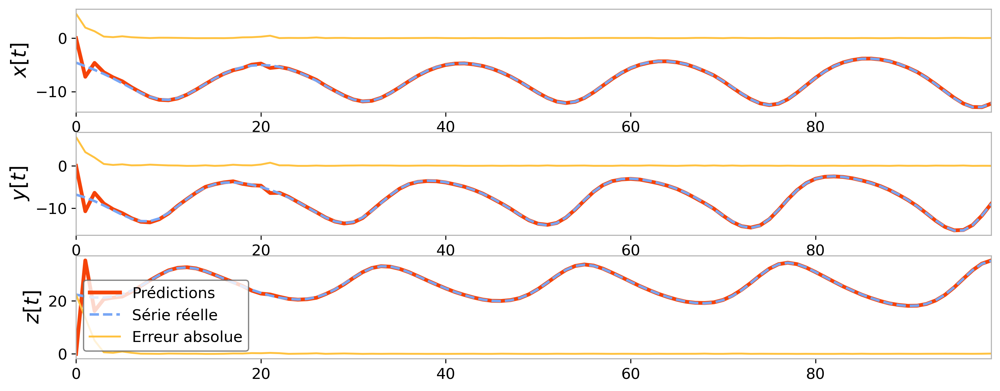

In [29]:
plot_results(outputs_pre, y_train1, sample=100)

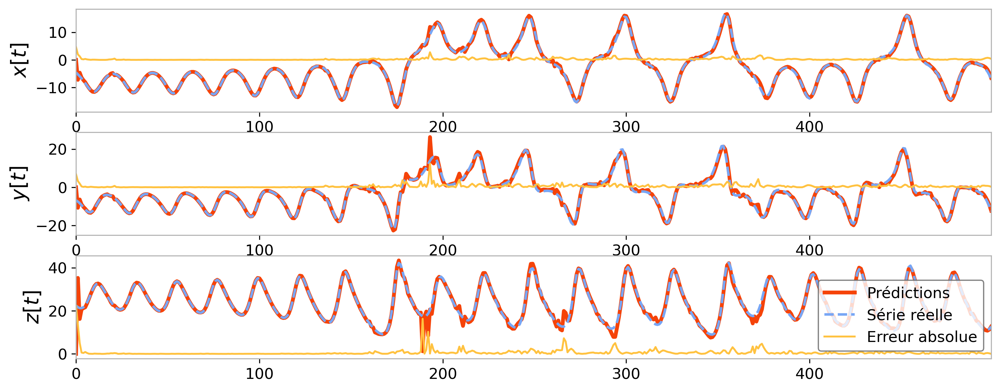

In [30]:
plot_results(outputs_pre, y_train1, sample=500)

#### Entraînement sur une séquence complète

In [31]:
reservoir = Reservoir(units, input_scaling=input_scaling, sr=spectral_radius,
                      lr=leak_rate, rc_connectivity=connectivity,
                      input_connectivity=input_connectivity, seed=seed)

readout   = RLS()


esn_online = reservoir >> readout

In [32]:
esn_online.train(X_train1, y_train1)

pred_online = esn_online.run(X_test1)  # Wout est maintenant figée

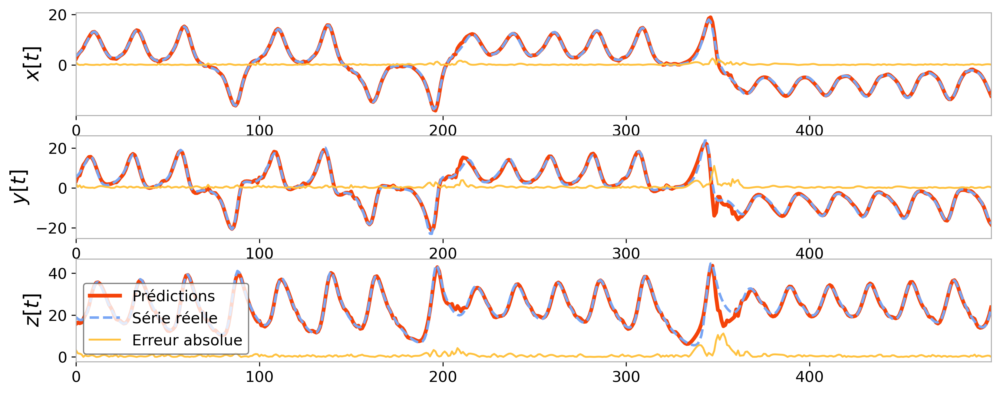

In [33]:
plot_results(pred_online, y_test1, sample=500)

Determination coefficient $R^2$ and NRMSE:

In [34]:
rsquare(y_test1, pred_online), nrmse(y_test1, pred_online)

(0.9949772578256109, 0.014117121497420036)

## Comprendre les hyperparamètres et leurs effets: plonger dans le reservoir <span id="hyper"/>

In [35]:
units = 300               # - nombre de neurones
leak_rate = 0.3           # - leaking rate
spectral_radius = 1.25    # - rayon spectral
input_scaling = 0.1       # - facteur de mise à l'échelle des entrées (input scaling)
connectivity = 0.1        # - densité des connexions du reservoir vers lui même
input_connectivity = 0.2  # et des entrées vers le reservoir
regularization = 1e-4     # - coefficient de régularisation (L2)
transient = 100           # - temps de chauffe du reseroivr
seed = 1234               # - reproductibilité

### 1. Le rayon spectral

Le rayon spectral est **la valeur propre maximale de la matrice des poids du réservoir ($W$)**.

In [36]:
states = []
radii = [0.1, 1.25, 10.0]
for sr in radii:
    reservoir = Reservoir(units, sr=sr, input_scaling=0.001, lr=leak_rate, rc_connectivity=connectivity,
                         input_connectivity=input_connectivity)

    s = reservoir.run(X_test1[:500])
    states.append(s)

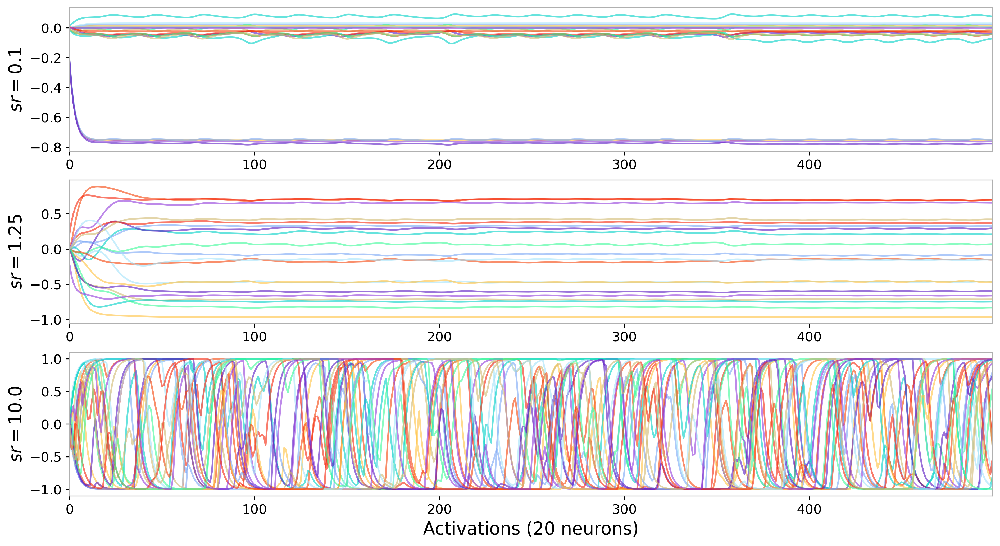

In [37]:
units_nb = 20

plt.figure(figsize=(15, 8))
for i, s in enumerate(states):
    plt.subplot(len(radii)*100+10+i+1)
    plt.plot(s[:, :units_nb], alpha=0.6)
    plt.ylabel(f"$sr={radii[i]}$")
plt.xlabel(f"Activations ({units_nb} neurons)")
plt.show()

- $-$ rayon spectral $\rightarrow$ dynamiques **stables**

- $+$ rayon spectral $\rightarrow$ dynamiques **chaotiques**

### 2. Le facteur de mise à l'échelle des entrées (*input scaling*)

Il s'agit d'un **coefficient appliqué à $W_{in}$**, venant changer l'échelle des données en entrée.

In [38]:
states = []
scalings = [0.00001, 0.001, 1.0]
for iss in scalings:
    reservoir = Reservoir(units, sr=spectral_radius, input_scaling=iss, lr=leak_rate,
                          rc_connectivity=connectivity, input_connectivity=input_connectivity)

    s = reservoir.run(X_test1[:500])
    states.append(s)

In [39]:
def correlation(states, inputs):
    return np.max([np.correlate(states[:, i].flatten(), inputs.flatten()) for i in range(states.shape[1])])

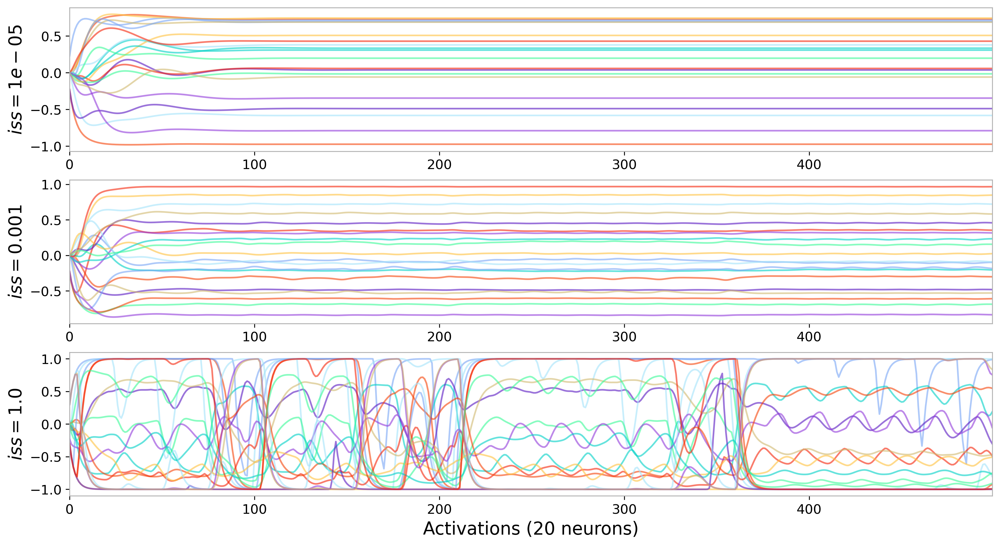

In [40]:
units_nb = 20

plt.figure(figsize=(15, 8))
for i, s in enumerate(states):
    plt.subplot(len(scalings)*100+10+i+1)
    plt.plot(s[:, :units_nb], alpha=0.6)
    plt.ylabel(f"$iss={scalings[i]}$")
plt.xlabel(f"Activations ({units_nb} neurons)")
plt.show()

Correlation moyenne des activités des neurones du reservoir avec les entrées :

In [41]:
for i, s in enumerate(states):
    corr = correlation(states[i], X_test1[:500])
    print(f"IS : {scalings[i]}, correlation max : {corr}")

IS : 1e-05, correlation max : 5654.146949848663
IS : 0.001, correlation max : 5658.500729694261
IS : 1.0, correlation max : 5804.2333455595935


- $+$ input scaling $\rightarrow$ activités **corrélées aux données**
- $-$ input scaling $\rightarrow$ activités **libres**

L'*input scaling* peut aussi être utilisé pour ajuster l'influence de chaque donnée en entrée.

### 3. Le taux de fuite de la mémoire (*leaking rate*)


$$
x(t+1) =  \underbrace{\color{red}{(1 - \alpha)} x(t)}_{\text{état actuel}} + \underbrace{\color{red}\alpha f(u(t+1), x(t))}_{\text{données suivantes}}
$$

avec $\alpha \in [0, 1]$ et:

$$ f(u, x) = \tanh(W_{in} \cdotp u + W \cdotp x) $$

In [42]:
states = []
rates = [0.02, 0.2, 0.9]
for lr in rates:
    reservoir = Reservoir(units, sr=spectral_radius, input_scaling=input_scaling, lr=lr,
                          rc_connectivity=connectivity, input_connectivity=input_connectivity)

    s = reservoir.run(X_test1[:500])
    states.append(s)

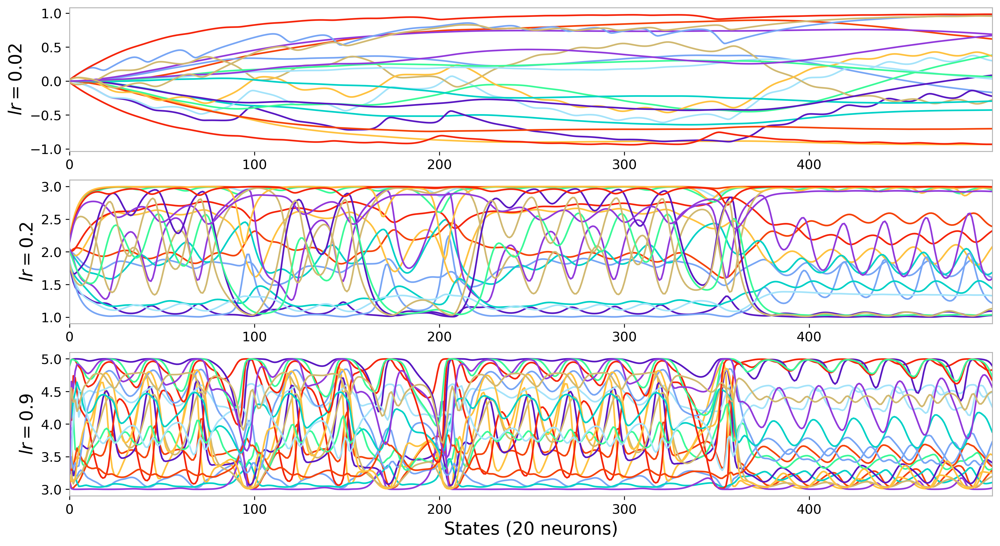

In [43]:
units_nb = 20

plt.figure(figsize=(15, 8))
for i, s in enumerate(states):
    plt.subplot(len(rates)*100+10+i+1)
    plt.plot(s[:, :units_nb] + 2*i)
    plt.ylabel(f"$lr={rates[i]}$")
plt.xlabel(f"States ({units_nb} neurons)")
plt.show()

- $+$ leaking rate $\rightarrow$ **faible inertie**, faible mémorisation des états précédents
- $-$ leaking rate $\rightarrow$ **forte inertie**, grande mémorisation des états précédents

Le *leaking rate* contrôle la "mémoire" de l'ESN. Il peut être vu comme l'inverse de sa constante de temps

## Application réelle : chute de robot <span id="chapitre4"/>

<div>
    <img src="./static/sigmaban.gif" width="500">
</div>

#### Chargement et préparation des données

In [44]:
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from joblib import delayed, Parallel
from tqdm import tqdm

In [45]:
features = ['com_x', 'com_y', 'com_z', 'trunk_pitch', 'trunk_roll', 'left_x', 'left_y',
            'right_x', 'right_y', 'left_ankle_pitch', 'left_ankle_roll', 'left_hip_pitch',
            'left_hip_roll', 'left_hip_yaw', 'left_knee', 'right_ankle_pitch',
            'right_ankle_roll', 'right_hip_pitch', 'right_hip_roll',
            'right_hip_yaw', 'right_knee']

prediction = ['fallen']
force = ['force_orientation', 'force_magnitude']

In [46]:
files = glob.glob("r4-data/experiments/*")
dfs = []

with Parallel(n_jobs=-1) as parallel:
    dfs = parallel(delayed(pd.read_csv)(f, compression="gzip", header=0, sep=",") for f in tqdm(files))

100%|██████████████████████████████████████| 1805/1805 [00:06<00:00, 281.50it/s]


In [47]:
X = []
Y = []
F = []
for i, df in enumerate(dfs):
    X.append(df[features].values)
    Y.append(df[prediction].values)
    F.append(df["force_magnitude"].values)

In [48]:
Y_train = []
for y in Y:
    y_shift = np.roll(y, -500)
    y_shift[-500:] = y[-500:]
    Y_train.append(y_shift)

In [49]:
def plot_robot(Y, Y_train, F):
    plt.figure(figsize=(10, 7))
    plt.plot(Y_train[1], label="Objectif")
    plt.plot(Y[1], label="Indicateur de chute")
    plt.plot(F[1], label="Force appliquée")
    plt.legend()
    plt.show()

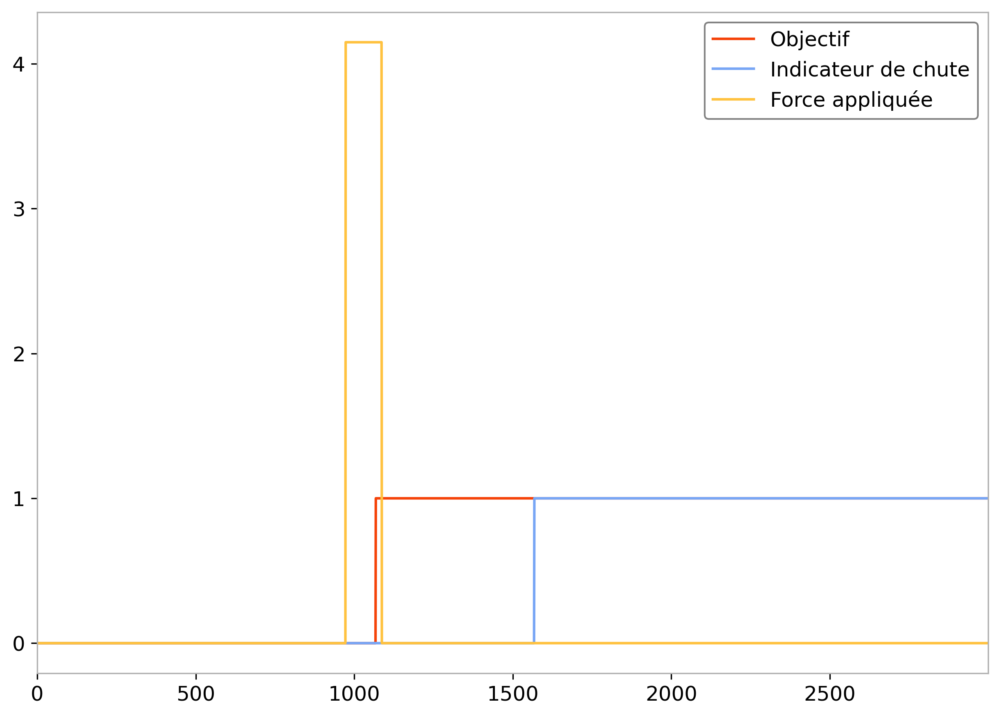

In [50]:
plot_robot(Y, Y_train, F)

#### Entraînement de l'ESN

Utilisation de l'objet `ESN`, modèle optimisé et distribué pour les Echo State Networks: **permet la parallelisation des calculs**

In [51]:
X_train, X_test, y_train, y_test = train_test_split(X, Y_train, test_size=0.2, random_state=42)

In [52]:
from reservoirpy.nodes import ESN

reservoir = Reservoir(300, lr=0.5, sr=0.99, input_bias=False)
readout   = Ridge(ridge=1e-3)
esn = ESN(reservoir=reservoir, readout=readout, workers=-1)  # version distribuée

In [53]:
esn = esn.fit(X_train, y_train)

In [54]:
res = esn.run(X_test)

In [55]:
from reservoirpy.observables import rmse
scores = []
for y_t, y_p in zip(y_test, res):
    score = rmse(y_t, y_p)
    scores.append(score)


filt_scores = []
for y_t, y_p in zip(y_test, res):
    y_f = y_p.copy()
    y_f[y_f > 0.5] = 1.0
    y_f[y_f <= 0.5] = 0.0
    score = rmse(y_t, y_f)
    filt_scores.append(score)

In [56]:
def plot_robot_results(y_test, y_pred):
    for y_t, y_p in zip(y_test, y_pred):
        if y_t.max() > 0.5:
            y_shift = np.roll(y, 500)
            y_shift[:500] = 0.0

            plt.figure(figsize=(5, 3))
            plt.plot(y_t, label="Objectif")
            plt.plot(y_shift, label="Chute")
            plt.plot(y_p, label="Prediction")
            plt.legend()
            plt.show()
            break

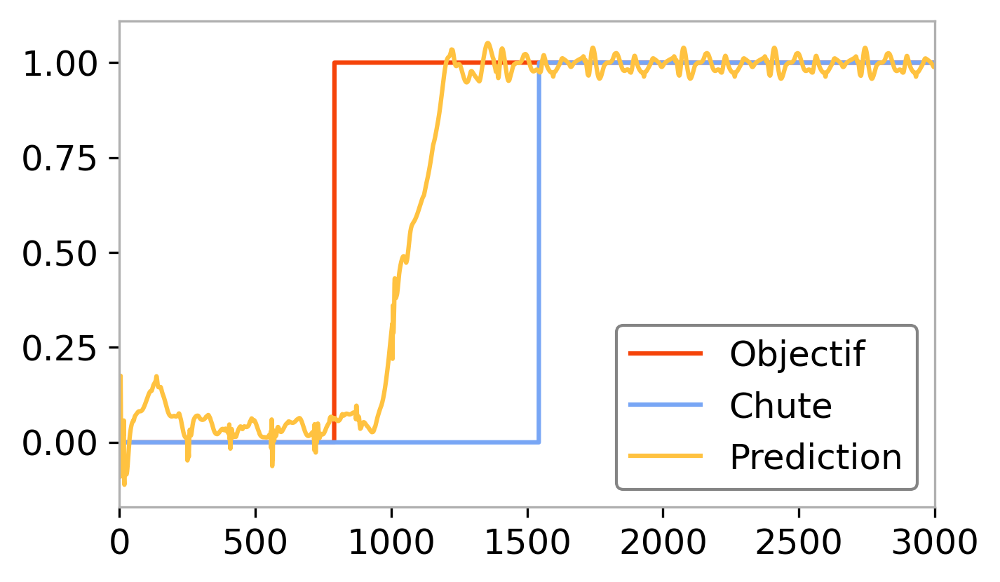

In [57]:
plot_robot_results(y_test, res)

In [58]:
print("RMSE moyenne :", f"{np.mean(scores):.4f}", "±", f"{np.std(scores):.5f}")
print("RMSE moyenne (avec seuil) :", f"{np.mean(filt_scores):.4f}", "±", f"{np.std(filt_scores):.5f}")

RMSE moyenne : 0.1693 ± 0.10344
RMSE moyenne (avec seuil) : 0.1443 ± 0.15187


## Application réelle : le chant des canaris domestiques <span id="chapitre5"/>

Les données peuvent être téléchargées sur Zenodo :
https://zenodo.org/record/4736597

<style>
.img-center {
    display: block;
    margin-left: auto;
    margin-right: auto;
    width: 70%;
    }
</style>
<div class="img-center">
    <img src="./static/canary.png" width="250">
</div>

Plusieurs motifs temporels répétitifs differents à décoder : les *phrases*.


- Un label par type de phrase à classifier dans le temps.
- Un label *SIL* annotant le silence, à détecter également pour permettre la segmentation du chant.

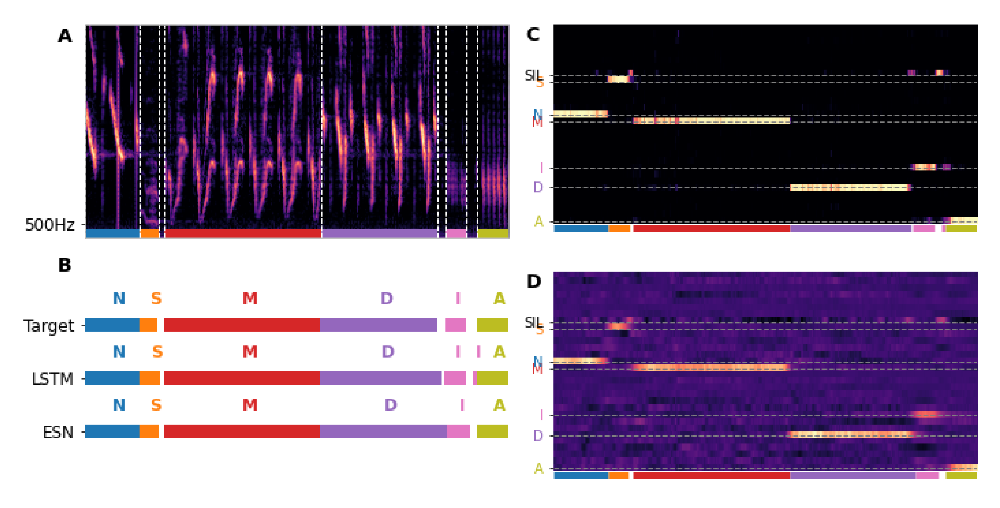

In [59]:
im = plt.imread("./static/canary_outputs.png")
plt.figure(figsize=(15, 15)); plt.imshow(im); plt.axis('off'); plt.show()

#### Chargement et préparation des données

In [61]:
import os
import glob
import math
import pandas as pd
import librosa as lbr

from tqdm import tqdm
from sklearn.utils.multiclass import unique_labels
from sklearn.preprocessing import OneHotEncoder

win_length = 1024
n_fft = 2048
hop_length = 512
fmin = 500
fmax = 8000
lifter = 40
n_mfcc = 13


def load_data(directory, max_songs=100):
    audios = sorted(glob.glob(directory + "/**/*.wav", recursive=True))
    annotations = sorted(glob.glob(directory + "/**/*.csv", recursive=True))


    X = []
    Y = []
    vocab = set()

    max_songs = min(len(audios), max_songs)

    for audio, annotation, _ in tqdm(zip(audios, annotations, range(max_songs)), total=max_songs):
        df = pd.read_csv(annotation)
        wav, rate = lbr.load(audio, sr=None)
        x = lbr.feature.mfcc(y=wav, sr=rate,
                              win_length=win_length, hop_length=hop_length,
                              n_fft=n_fft, fmin=fmin, fmax=fmax, lifter=lifter,
                              n_mfcc=n_mfcc)
        delta = lbr.feature.delta(x, mode="wrap")
        delta2 = lbr.feature.delta(x, order=2, mode="wrap")

        X.append(np.vstack([x, delta, delta2]).T)

        y = [["SIL"]] * x.shape[1]

        for annot in df.itertuples():
            start = max(0, round(annot.start * rate / hop_length))
            end = min(x.shape[1], round(annot.end * rate / hop_length))
            y[start:end] = [[annot.syll]] * (end - start)
            vocab.add(annot.syll)

        Y.append(y)

    return X, Y, list(vocab)

X, Y, vocab = load_data("./canary-data")

100%|█████████████████████████████████████████| 100/100 [00:10<00:00,  9.22it/s]


#### One-hot encoding des labels de phrase

In [62]:
one_hot = OneHotEncoder(categories=[vocab], sparse_output=False)

Y = [one_hot.fit_transform(np.array(y)) for y in Y]

Dans un premier (court) temps, on se limitera à traiter 100 chants. L'entraînement sera effectué sur les 90 premiers, et le test sur les 10 derniers.

Au total, il y a 459 chants, il est donc possible de varier les constructions de jeu de données, voire de tester la robustesse des résultats par validation croisée.

In [63]:
X_train, y_train = X[:-10], Y[:-10]
X_test, y_test = X[-10:], Y[-10:]

#### Entraînement de l'ESN

In [64]:
from reservoirpy.nodes import ESN

units = 1000
leak_rate = 0.05
spectral_radius = 0.5
input_scaling = 0.001
connectivity = 0.1
input_connectivity = 0.1
regularization = 1e-5
seed = 1234

reservoir = Reservoir(units, sr=spectral_radius, input_scaling=input_scaling,
                      lr=leak_rate, rc_connectivity=connectivity,
                      seed=seed)

readout = Ridge(ridge=regularization)


esn = ESN(reservoir=reservoir, readout=readout, workers=-1, backend="loky")

In [65]:
esn = esn.fit(X_train, y_train)

In [66]:
outputs = esn.run(X_test)

In [67]:
from sklearn.metrics import accuracy_score

scores = []
for y_t, y_p in zip(y_test, outputs):
    targets = np.vstack(one_hot.inverse_transform(y_t)).flatten()

    top_1 = np.argmax(y_p, axis=1)
    top_1 = np.array([vocab[t] for t in top_1])

    accuracy = accuracy_score(targets, top_1)

    scores.append(accuracy)

In [68]:
scores  # pour chaque chant testé

[0.9494949494949495,
 0.9085303186022611,
 0.9531759739013625,
 0.9410002304678498,
 0.9638157894736842,
 0.9478260869565217,
 0.892835458409229,
 0.9403111739745403,
 0.9212787899621864,
 0.8765393116514051]

In [69]:
print("Précision moyenne :", f"{np.mean(scores):.4f}", "±", f"{np.std(scores):.5f}")

Précision moyenne : 0.9295 ± 0.02716


## Application réelle: analyse de sentiment <span id="imdb"></span>

Analyse des données de Maas *et al.* (2011): **IMDB dataset**.

Composé d'avis attribués à des films par les utilisateurs de IMDB.

**Objectif**: attribuer un score de 0 ou 1, aux commentaires respectivements **positifs** et **négatifs**.

- Technique proposée: RC sur *word embeddings*

<style>
.img-center {
    display: block;
    margin-left: auto;
    margin-right: auto;
    width: 100%;
    }
</style>
<div class="img-center">
    <img src="./static/linear-relationships.svg" width="800">
</div>

### Utiliser *spacy*

In [70]:
import spacy

nlp = spacy.load("en_core_web_lg")

In [71]:
sad_doc = nlp("I hate everything about this movie.")
happy_doc = nlp("I really liked this movie!")
unrelated_doc = nlp("Dogs usually hate cats.")

In [72]:
print("Similarités: ", sad_doc.similarity(happy_doc), sad_doc.similarity(unrelated_doc))

Similarités:  0.9271912733659942 0.5860950057882411


In [73]:
for token in sad_doc:
    print(token)

I
hate
everything
about
this
movie
.


In [74]:
print(token.vector)

[-0.076454 -4.6896   -4.0431   -3.4333   11.758     3.7212   -0.98133
  2.7902    0.43608  -2.4425    6.9311    2.7647   -1.7035    6.3123
  2.6301    1.1136   -3.3689   -5.4062   -3.6021   -9.8479    4.6016
 -0.50542   0.66145  -3.552    -4.3909   -2.3702   -1.8251   -4.8768
  2.7245    5.3177   -0.50146  -7.2556   -4.6895   -5.4604   -5.6257
  1.6121   -0.8789    1.6936    1.9308    6.7769    3.6739    0.28693
 -0.22849  -4.0779   -4.7086    2.0722   -2.3405   -1.6884   -1.9876
 -2.2207   -2.6514    3.3686    0.12579  -5.8689    4.6715    1.1999
 -4.3008    2.1239    0.029298  3.0072   -2.4435   -3.9103    1.0187
 -2.0263    5.0496    0.66619  -3.978    -4.0066   -1.8538    0.65539
 -2.1525   -9.2576   -2.6783   -1.4023    4.0334   -2.3129   -5.1051
 -0.91791   0.11236   2.626    -5.5713   -2.7705   -2.5144    0.069018
  6.1091   -3.0522    0.025957 -3.9766   -0.42248   0.60821  -4.883
  2.8595    0.046312 -5.0708   -0.87191  -3.0453   -1.5862   -2.7432
  3.6893    0.69812   6.3418  

In [75]:
import glob
from tqdm import tqdm

IMDB_DATA = "./imdb-data/aclImdb_v1/aclImdb/"

MAX_SAMPLES_PER_CLASS = 1000

def load_set(directory):
    
    pos_files = glob.glob(IMDB_DATA + directory + "/pos/*.txt")[:MAX_SAMPLES_PER_CLASS]
    neg_files = glob.glob(IMDB_DATA + directory + "/neg/*.txt")[:MAX_SAMPLES_PER_CLASS]
    
    labels = []
    docs = []
    
    for file in tqdm(pos_files + neg_files):
        
        with open(file, "r+") as fp:
            doc = nlp(fp.read())
            docs.append(doc)
            
            if "pos" in file:
                labels.append(np.array([1] * len(doc)))
            else:
                labels.append(np.array([0] * len(doc)))
        
    return docs, labels

In [76]:
train_set, train_labels = load_set("train")

100%|███████████████████████████████████████| 2000/2000 [00:57<00:00, 34.57it/s]


In [77]:
test_set, test_labels = load_set("test")

100%|███████████████████████████████████████| 2000/2000 [00:50<00:00, 39.83it/s]


In [78]:
X_train = [np.concatenate([tok.vector.reshape(1, -1) for tok in doc], axis=0) for doc in train_set]
X_test = [np.concatenate([tok.vector.reshape(1, -1) for tok in doc],axis=0) for doc in test_set]
y_train = [y.reshape(-1, 1) for y in train_labels]
y_test = [y.reshape(-1, 1) for y in test_labels]

Taille du jeu de données:

- *train*: 1000 avis postifis + 1000 avis négatifs, de longueur variable.
- *test*: idem.

Chaque avis a une longueur N, son nombre de *tokens*. Chaque token est encodé par un vecteur de 300 dimensions.

### Entraînement de l'ESN

In [79]:
from reservoirpy.nodes import Reservoir, Ridge

reservoir = Reservoir(500, sr=0.9, input_scaling=0.01, lr=0.1, input_bias=False)
readout = Ridge(ridge=1e-8)

esn = reservoir >> readout

In [80]:
esn.fit(X_train, y_train)

'Model-5': Model('Reservoir-16', 'Ridge-4')

### Prédiction

On obtient un score par pas de temps. 
Pour réduire: **on prend le maximum de score sur tous les pas de temps, et on applique un seuil.**

In [81]:
y_pred = esn.run(X_test)

In [82]:
threshold = 0.85  # choisi grâce à la ROC

In [83]:
def plot_esn_response():
    plt.figure(figsize=(8, 3))
    plt.plot(y_pred[1])
    plt.axhline(threshold, color="cornflowerblue")
    plt.scatter(y_pred[1].argmax(), y_pred[1].max(), color="cornflowerblue")
    plt.xlabel("Token index")
    plt.ylabel("ESN response")
    plt.title("A positive sample")

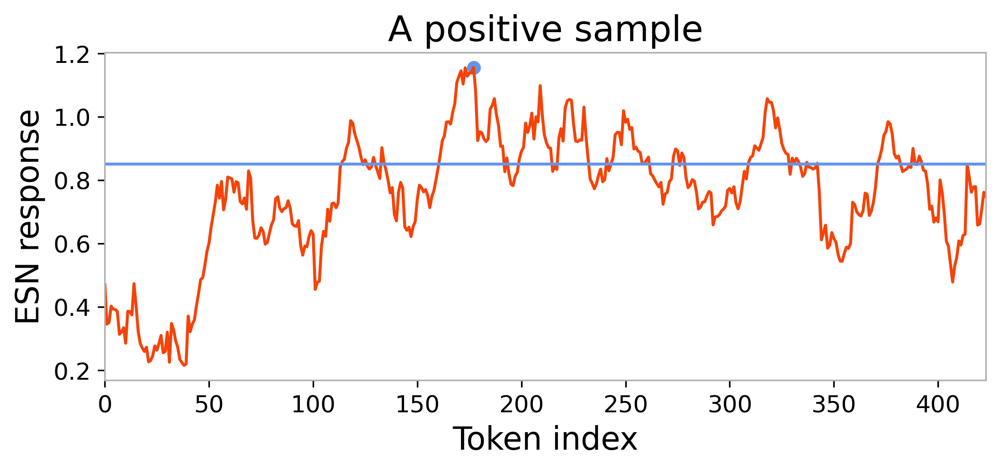

In [84]:
plot_esn_response()

In [85]:
y_pred_thr = [1 if y.max() > threshold else 0 for y in y_pred]
y_test_thr = [1 if y.max() > threshold else 0 for y in y_test]

In [86]:
from sklearn.metrics import accuracy_score

score = accuracy_score(y_test_thr, y_pred_thr)

In [87]:
print("Précision: ", score)

Précision:  0.7685


## Merci de votre attention.


**Nathan Trouvain <br>
Inria - Mnemosyne**

<br>
<br>
<br>
AI4I - 20 janvier 2021
